In [46]:
import numpy as np
from numpy import exp, sqrt, abs
import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
plt.rcParams['font.size'] = 14

In [47]:
CASE=1
if CASE==0: dname="DATA"
if CASE==1: dname="DATA_b"

fname=dname+'/x_RBM_q0.1.dat'
# loading data: each row is a list of visible units
# NOTE: data "x" here is named "v" for "visible"
v = np.loadtxt(fname, delimiter=" ",dtype=int)
# store in v0, because later we will shuffle v
v0 = np.copy(v)
# to start, take a small subsample
# v = v[1:11]
N = len(v)
L = len(v[1])

SPINS = True
#SPINS = False

if SPINS:
    # sigmoid takes into account energy difference =2
    GAP=2
    # convert 0,1 -> -1,1
    v = 2*v - 1
    vmin=-1
else:
    GAP=1
    vmin=0

print(f'each of N={N} data has L={L} digits')

for i in range(min(12,N)):
    if SPINS: print(v0[i],"\n->",v[i])
    else: print(v[i])
print('...')

each of N=10000 data has L=20 digits
[0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0] 
-> [-1 -1  1 -1  1 -1 -1 -1 -1 -1  1 -1 -1  1 -1 -1 -1 -1  1 -1]
[0 0 1 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1] 
-> [-1 -1  1 -1  1 -1 -1 -1 -1 -1 -1  1  1 -1 -1 -1 -1 -1 -1  1]
[0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 1] 
-> [-1 -1  1 -1 -1  1 -1 -1 -1 -1 -1  1 -1  1 -1 -1 -1 -1 -1  1]
[0 1 0 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0] 
-> [-1  1 -1 -1 -1 -1 -1  1 -1  1 -1 -1 -1 -1  1 -1  1 -1 -1 -1]
[0 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0] 
-> [-1 -1  1 -1 -1 -1  1 -1  1 -1 -1 -1 -1 -1  1 -1 -1  1 -1 -1]
[0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0] 
-> [-1 -1 -1  1 -1  1 -1 -1 -1 -1  1 -1  1 -1 -1 -1 -1 -1  1 -1]
[0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0] 
-> [-1 -1  1 -1 -1  1 -1 -1 -1 -1  1 -1 -1  1 -1 -1 -1  1 -1 -1]
[0 0 1 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1] 
-> [-1 -1  1 -1  1 -1 -1 -1 -1 -1 -1  1  1 -1 -1 -1 -1 -1 -1  1]
[1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0] 
-> [ 1 -1 -1 -1 -1 -1  1 -1 -1  1 -1 -1 -1  1 -1 -1  1 -

## initialize

In [48]:
# RBM, nr of hidden units
if CASE==0: M = 3
if CASE==1: M = 6
# range of each initial weight
sigma = sqrt(4. / float(L + M))
# random seed for reproducibility
np.random.seed(12345)
# initial weights from a Normal distr. (see literature, e.g. page 98 of Mehta's review)
w = sigma * np.random.randn(L,M)
a = sigma * np.random.randn(L)
b = np.zeros(M)
print("w=",w);print("a=",a);print("b=",b)
w0,a0,b0=np.copy(w),np.copy(a),np.copy(b)

w= [[-8.02929500e-02  1.87857033e-01 -2.03740626e-01 -2.17975359e-01
   7.71042577e-01  5.46538733e-01]
 [ 3.64414674e-02  1.10509933e-01  3.01635468e-01  4.88891926e-01
   3.95052168e-01 -5.08419748e-01]
 [ 1.07860593e-01  8.97870182e-02  5.30657642e-01  3.47686193e-01
  -7.85106746e-01 -1.45848643e-01]
 [ 6.54645586e-01 -1.72021203e-01 -2.11704013e-01  1.87088914e-01
   1.27434065e+00 -4.00558390e-01]
 [-2.26352263e-01  4.86843697e-02  1.18694804e-01  2.05440307e-01
   3.68807287e-04  5.27085566e-01]
 [-2.79874977e-01 -3.26005239e-01 -9.29681343e-01 -7.29850429e-01
  -3.37616829e-01  2.19707060e-01]
 [-4.96540360e-01  4.70000651e-02 -4.17143902e-01  1.30567343e-01
  -9.25440195e-01 -7.82671864e-02]
 [-6.04820407e-01 -3.80753951e-01 -5.12659443e-01  1.12315611e-01
   1.48257566e-01 -2.95698627e-01]
 [ 1.29940923e-01  5.29412453e-01  2.74078923e-02  9.67535462e-02
  -4.65250272e-03  3.94119531e-01]
 [ 5.20568556e-01 -3.60564048e-01 -6.07609535e-01  8.70151550e-03
   2.97454498e-01 -2.5

## Plotting

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 1, 1, 1, 1, 1]


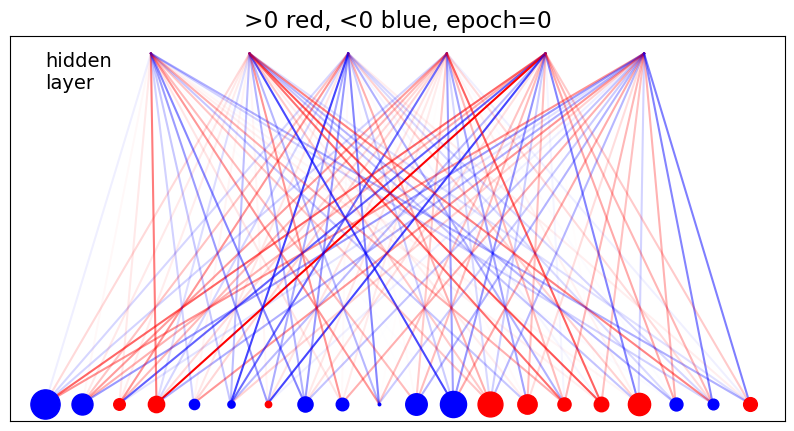

In [49]:
def create_coord(np,x0,f=1.0):
    x=[x0] * np
    print(x)
    y=list(range(np))
    for i in range(np):
        y[i] = f*(y[i]/(np-1.) - 0.5)
    return (x,y)
(x1,y1)=create_coord(L,0)
(x2,y2)=create_coord(M,1,f=0.7)

def mycolor(val):
    if val>0: return 'red'
    elif val<0: return 'blue'
    else: return 'black'

def plotgraph_vert(epoch=0):
    A=2./w.max()
    for i in range(L):
        for j in range(M):
            ex, ey, col = (x1[i],x2[j]),(y1[i],y2[j]),mycolor(w[i][j])
            plt.plot(ex, ey, col, zorder=1, lw=A*abs(w[i][j]))
    # Scatter plot on top of lines
    
    A=300./(a.max()+b.max())
    
    for i in range(L):
        plt.scatter(x1[i], y1[i], s=A*abs(a[i]), zorder=2, c=mycolor(a[i]))

    for j in range(M):
        plt.scatter(x2[j], y2[j], s=A*abs(b[j]), zorder=2, c=mycolor(b[j]), marker="s")
    plt.figaspect(1)
    plt.title(f'>0 red, <0 blue, epoch={epoch}')
    plt.show()
    
def plotgraph(epoch=0):
    fig, ax = plt.subplots(1,1 , figsize=(10, 5))
    ax.tick_params(left=False,bottom=False)
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    
    A=1./max(w.max(),-w.min())
    for i in range(L):
        for j in range(M):
            ex, ey, col = (y1[i],y2[j]),(x1[i],x2[j]),mycolor(w[i][j])
            ax.plot(ex, ey, col, zorder=1, alpha=A*abs(w[i][j]))
    # Scatter plot on top of lines
    #A=300./(a.max()+b.max())
    A=500.
    for i in range(L):
        ax.scatter(y1[i],x1[i], s=A*abs(a[i]), zorder=2, c=mycolor(a[i]))
    for j in range(M):
        ax.scatter(y2[j], x2[j], s=min(300,A*abs(b[j])), zorder=2, c=mycolor(b[j]), marker="s")
    ax.set_title(f'>0 red, <0 blue, epoch={epoch}')
    ax.text(-0.5,0.9,"hidden\nlayer")
    plt.show()
                  
plotgraph()

In [50]:
# eq(213) page 97, activation via sigmoid
# taking into account energy gap DE=2 for "spin" variables (-1,1)
def activate(v_in,wei,bias,DE,info=False):
    act = np.dot(v_in, wei) + bias
    n = np.shape(act)
    prob = 1. / (1. + exp(-DE*act))
    v_out = np.full(n, vmin, dtype=int) # a list on -1's or 0's
    v_out[np.random.random_sample(n) < prob] = 1 # activate the 1's with probability prob
    if info:
        print('input=', v_in)
        print('act=',act)
        print('prob=',prob)
        print('output=',v_out)
    return v_out

k = 0
activate(v[k],w,b,GAP,info=True)

input= [-1 -1  1 -1  1 -1 -1 -1 -1 -1  1 -1 -1  1 -1 -1 -1 -1  1 -1]
act= [-0.55363703  1.08935447  3.20797777  0.05050731 -0.65476091 -0.30478319]
prob= [0.24837944 0.89832121 0.99836741 0.5252322  0.21256687 0.35215812]
output= [-1  1  1  1 -1 -1]


array([-1,  1,  1,  1, -1, -1])

## RBM train


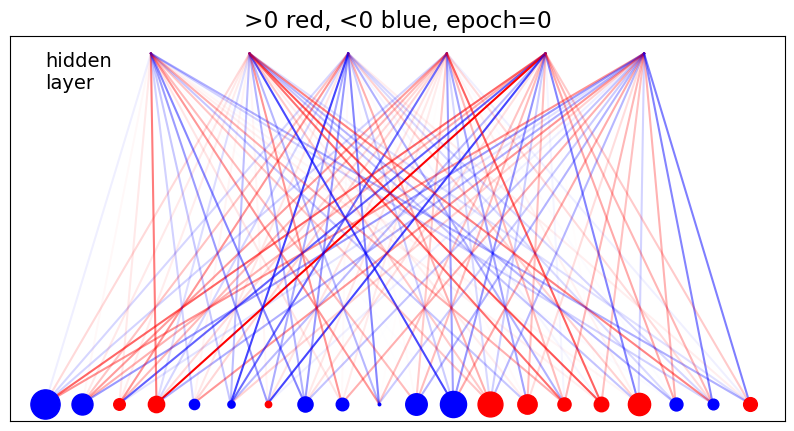

----------- epoch = 0   k= 499   m= 500
dw = [[-0.076  0.184 -0.056  0.132 -0.316  0.088]
 [-0.068  0.032 -0.184  0.236 -0.3    0.264]
 [-0.136 -0.188 -0.46  -0.384  0.336 -0.1  ]
 [-0.292 -0.096 -0.08  -0.164 -0.204 -0.08 ]
 [ 0.172 -0.168 -0.032 -0.204  0.364 -0.528]
 [ 0.284  0.192  0.272  0.244  0.18  -0.536]
 [ 0.4    0.244 -0.356  0.264  0.392  0.052]
 [ 0.184  0.292  0.132  0.472  0.12   0.084]
 [-0.24  -0.036 -0.124  0.096  0.056 -0.036]
 [-0.136  0.14  -0.06   0.408 -0.224  0.092]
 [-0.212  0.08   0.024 -0.308 -0.124 -0.2  ]
 [ 0.06   0.384  0.08   0.244  0.156 -0.176]
 [ 0.056 -0.244 -0.556 -0.104  0.36  -0.148]
 [-0.14   0.    -0.152  0.1    0.068 -0.208]
 [-0.108 -0.512 -0.416 -0.084  0.116 -0.056]
 [-0.376 -0.42  -0.356 -0.16   0.064 -0.012]
 [ 0.028  0.24  -0.576  0.372  0.42   0.048]
 [-0.088  0.436 -0.132  0.464 -0.136  0.044]
 [-0.02  -0.12  -0.048 -0.332 -0.092  0.176]
 [ 0.096 -0.14  -0.236 -0.136  0.008  0.156]]
da = [ 0.064 -0.032 -0.748 -0.408 -0.392 -0.36  -0.5  

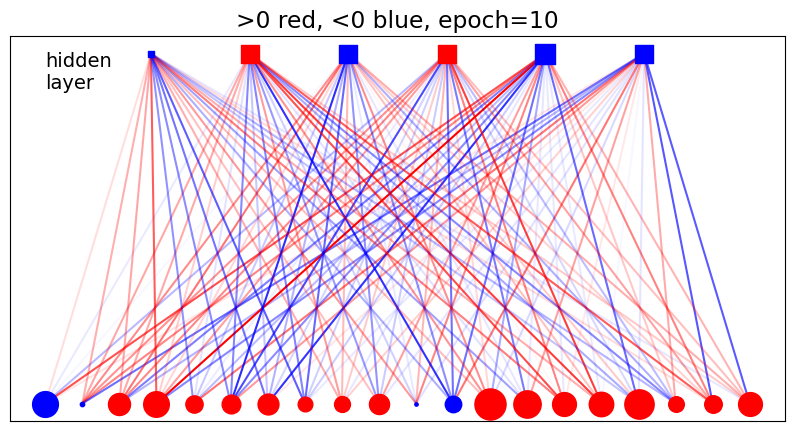

l_rate =  0.9090909090909092


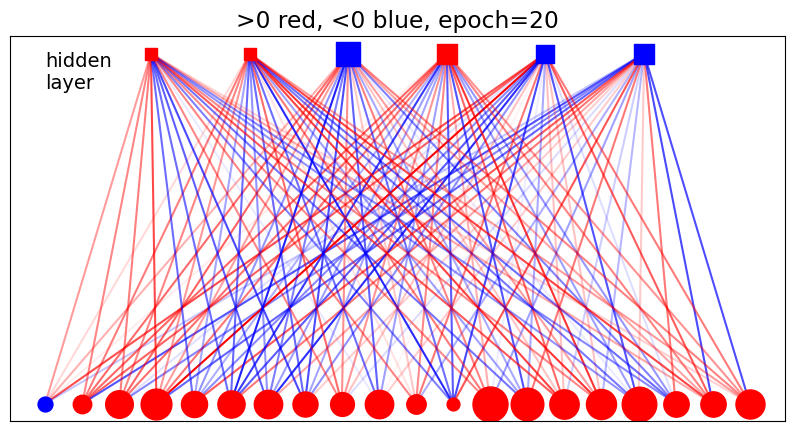

l_rate =  0.8333333333333337


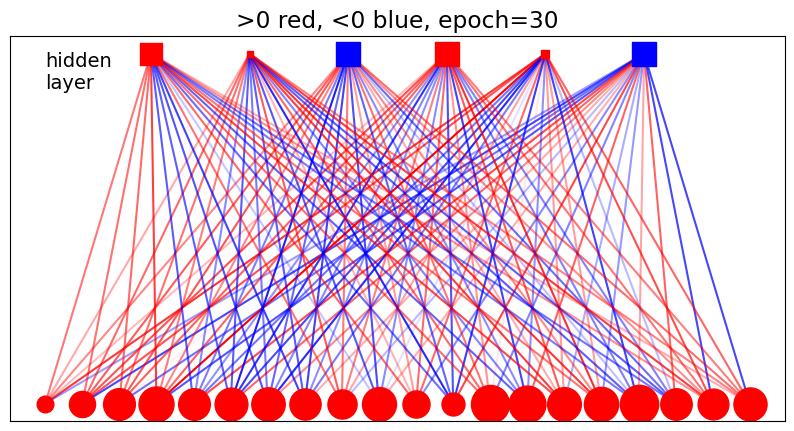

l_rate =  0.7692307692307697


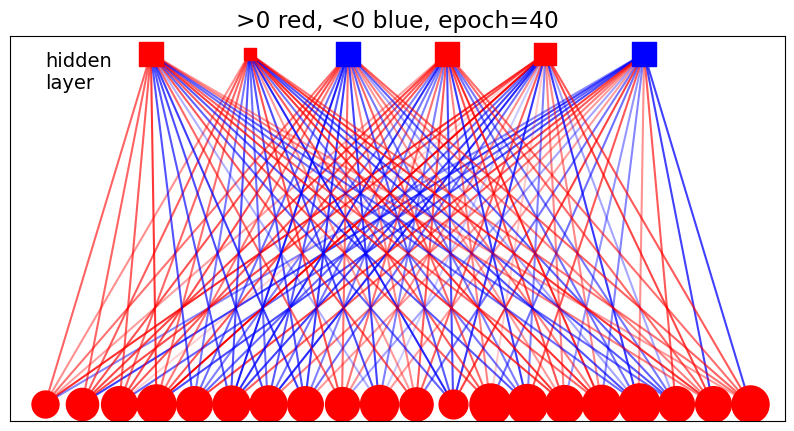

l_rate =  0.7142857142857149


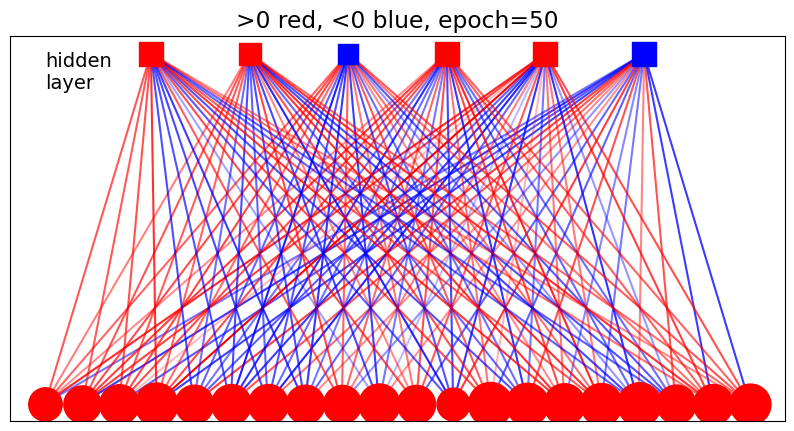

l_rate =  0.6666666666666671


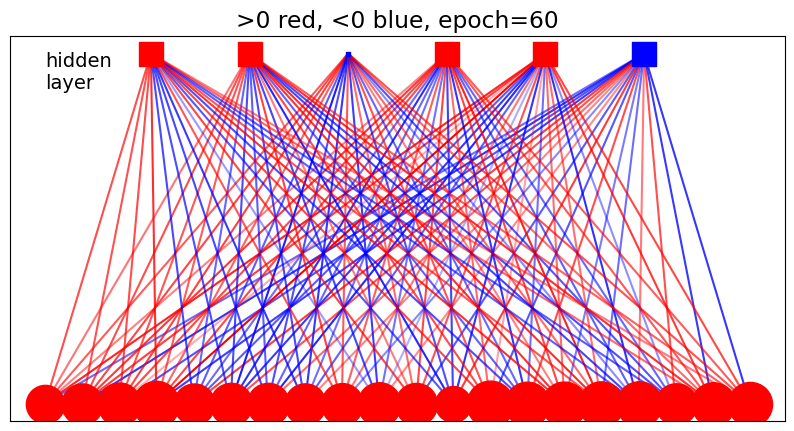

l_rate =  0.6250000000000006


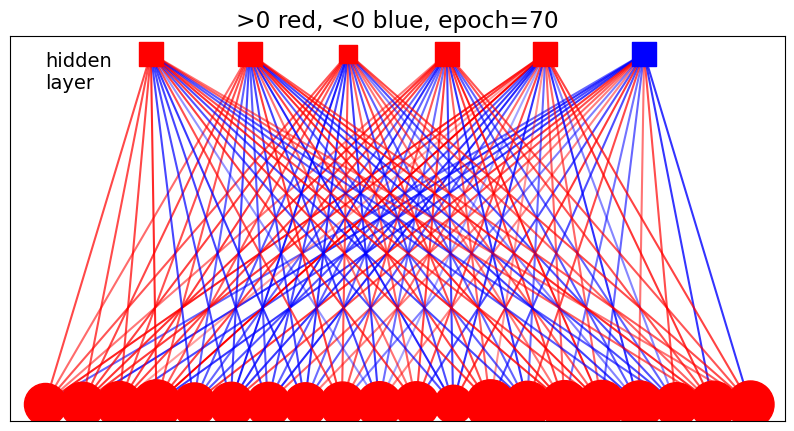

l_rate =  0.5882352941176475


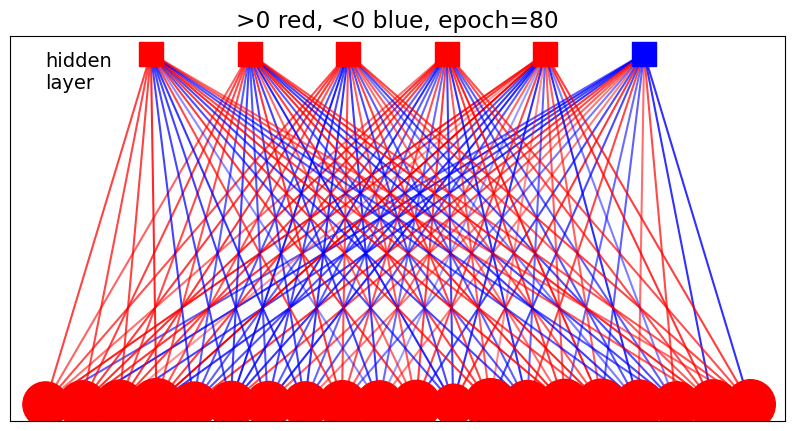

l_rate =  0.555555555555556


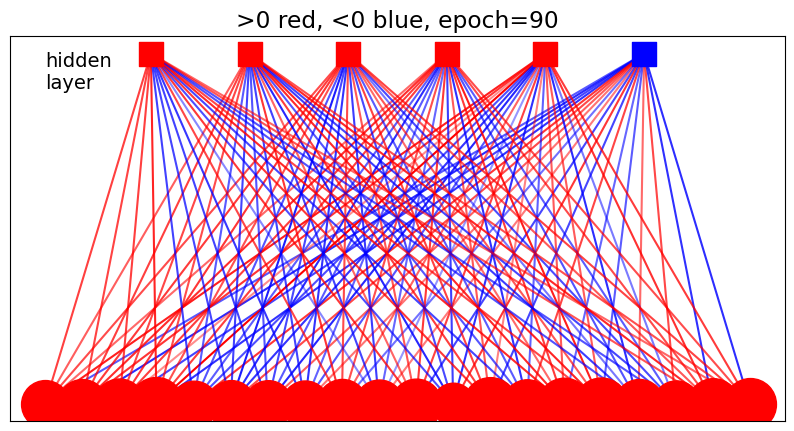

l_rate =  0.5263157894736847


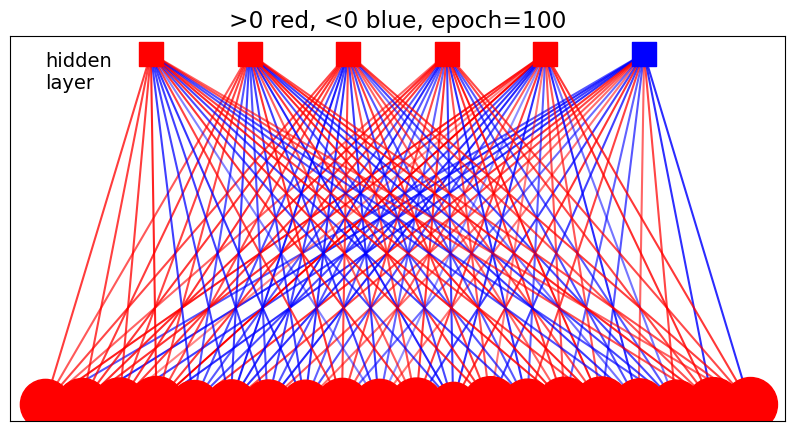

l_rate =  0.5000000000000009


In [51]:
# random seed for reproducibility
np.random.seed(12345)

plotgraph(0)

# learning rate
l_rate = 1.0

# initialize Adam 
beta1=0.9
beta2=0.999
epsilon=1e-8
m_dw, v_dw = 0, 0
m_db, v_db = 0, 0
m_da, v_da = 0, 0
t=1

# minibatch
mini, m = 500, 0

# train model
print('===================================================')
for epoch in range(100):
    # aggregate normalization of batch statistics and learning rate
    l_rate_m = l_rate / mini
    for k in range(N):
        if m==0:
            # initialize averages in miniblock
            v_data, v_model = np.zeros(L),np.zeros(L)
            h_data, h_model = np.zeros(M),np.zeros(M)
            vh_data,vh_model= np.zeros((L,M)),np.zeros((L,M))

        # positive CD phase: generating h 
        h = activate(v[k],w,b,GAP)
        # negative CD phase: generating fantasy vf
        vf = activate(h,w.T,a,GAP)
        # one more positive CD phase: generating fantasy h from fantasy vf 
        hf = activate(vf,w,b,GAP)

        v_data  += v[k]
        v_model += vf
        h_data  += h
        h_model += hf
        vh_data += np.outer(v[k].T,h)
        vh_model+= np.outer(vf.T,hf)
    
        m += 1
        # minibatch
        if m==mini:
            # gradient of the likelihood: follow it along its positive direction
            # with a Adam optimizer
            dw = l_rate_m*(vh_data - vh_model)
            da = l_rate_m*(v_data - v_model)
            db = l_rate_m*(h_data - h_model)
            
            ##********update***********##
            m_dw = beta1*m_dw + (1-beta1)*(vh_data - vh_model)
            m_db = beta1*m_db + (1-beta1)*(h_data - h_model)
            m_da = beta1*m_da + (1-beta1)*(v_data - v_model)

            ## rms beta 2
            v_dw = beta2*v_dw + (1-beta2)*((vh_data - vh_model)**2)
            v_db = beta2*v_db + (1-beta2)*((h_data - h_model)**2)
            v_da = beta2*v_da + (1-beta2)*((v_data - v_model)**2)

            ## bias correction
            m_dw_corr = m_dw/(1-beta1**t)
            m_db_corr = m_db/(1-beta1**t)
            m_da_corr = m_da/(1-beta1**t)

            v_dw_corr = v_dw/(1-beta2**t)
            v_db_corr = v_db/(1-beta2**t)
            v_da_corr = v_da/(1-beta2**t)
            
            if epoch<=1 and k<=mini:
                print('----------- epoch =',epoch,'  k=',k,'  m=',m)
                print('dw =',dw)
                print('da =',da)
                print('db =',db)
                
            ## update weights and biases
            w = w - l_rate_m*(m_dw_corr/(np.sqrt(v_dw_corr)+epsilon))
            b = b - l_rate_m*(m_db_corr/(np.sqrt(v_db_corr)+epsilon))
            a = a - l_rate_m*(m_da_corr/(np.sqrt(v_da_corr)+epsilon))
            m=0
            t=t+1 #update the time
    
    # randomize the order of input data
    np.random.shuffle(v)
    # decrease the learning rate (here as a power law)
    l_rate = l_rate / (0.01 * l_rate + 1)
    if epoch%10==9:
        plotgraph(epoch+1)
        print('l_rate = ',l_rate)

In [39]:
print('w0=',w0);print('a0=',a0);print('b0=',b0)
print('w=',w);print('a=',a);print('b=',b)

w0= [[-8.02929500e-02  1.87857033e-01 -2.03740626e-01 -2.17975359e-01
   7.71042577e-01  5.46538733e-01]
 [ 3.64414674e-02  1.10509933e-01  3.01635468e-01  4.88891926e-01
   3.95052168e-01 -5.08419748e-01]
 [ 1.07860593e-01  8.97870182e-02  5.30657642e-01  3.47686193e-01
  -7.85106746e-01 -1.45848643e-01]
 [ 6.54645586e-01 -1.72021203e-01 -2.11704013e-01  1.87088914e-01
   1.27434065e+00 -4.00558390e-01]
 [-2.26352263e-01  4.86843697e-02  1.18694804e-01  2.05440307e-01
   3.68807287e-04  5.27085566e-01]
 [-2.79874977e-01 -3.26005239e-01 -9.29681343e-01 -7.29850429e-01
  -3.37616829e-01  2.19707060e-01]
 [-4.96540360e-01  4.70000651e-02 -4.17143902e-01  1.30567343e-01
  -9.25440195e-01 -7.82671864e-02]
 [-6.04820407e-01 -3.80753951e-01 -5.12659443e-01  1.12315611e-01
   1.48257566e-01 -2.95698627e-01]
 [ 1.29940923e-01  5.29412453e-01  2.74078923e-02  9.67535462e-02
  -4.65250272e-03  3.94119531e-01]
 [ 5.20568556e-01 -3.60564048e-01 -6.07609535e-01  8.70151550e-03
   2.97454498e-01 -2.

## Test: noise reduction

In [ ]:
from IPython.display import display_html 
import pandas as pd

ampl=40.

# original, non-reshuffled data in v0
v1 = np.zeros_like(v0)
for k in range(N):
    # positive CD phase: generating h 
    h = activate(v0[k],w,b,ampl*GAP)
    # negative CD phase: generating fantasy vf with low T == large GAP
    v1[k] = activate(h,w.T,a,ampl*GAP)
# difference between fantasy and data
diff = (v1 - v0)/2
str0 = fname+'_M'+str(M)+'-mini'+str(mini)
np.savetxt(str0+".fantasy", (v1+1)/2, fmt='%d',delimiter=' ')  
np.savetxt(str0+'.diff', diff, fmt='%d',delimiter=' ')  


def is_one(cell_value):
    color0 = 'background-color: gray; color: white'
    color1 = 'background-color: gold;'
    if type(cell_value) in [float, int]:
        if cell_value == 1:
            return color1
    return color0

N1=12
df0 = pd.DataFrame(v0[:N1])
df1 = pd.DataFrame(((v1[:N1]-vmin)/(1-vmin)).astype(int))

df0s = df0.style.set_table_attributes("style='display:inline'")
df1s = df1.style.set_table_attributes("style='display:inline'")
df0s.applymap(is_one)
df1s.applymap(is_one)
sty = [dict(selector="caption",props=[("font-size", "150%")])]
df0s.set_caption('Original').set_table_styles(sty)
df1s.set_caption('Denoised').set_table_styles(sty)

display_html(df0s._repr_html_()+df1s._repr_html_(), raw=True)

# Adam optimizer

In [11]:
import numpy as np
class AdamOptim():        
    def update(self, t, w, b, dw, db):
        
        ##*********initialize*********##
        eta=0.001
        beta1=0.9
        beta2=0.999
        epsilon=1e-8
        self.m_dw, self.v_dw = 0, 0
        self.m_db, self.v_db = 0, 0
        self.beta1 = beta1
        self.beta2 = beta2
        self.epsilon = epsilon
        self.eta = eta
        
        ##********update***********##
        
        self.m_dw = self.beta1*self.m_dw + (1-self.beta1)*dw
        self.m_db = self.beta1*self.m_db + (1-self.beta1)*db

        ## rms beta 2
        self.v_dw = self.beta2*self.v_dw + (1-self.beta2)*(dw**2)
        self.v_db = self.beta2*self.v_db + (1-self.beta2)*(db)

        ## bias correction
        m_dw_corr = self.m_dw/(1-self.beta1**t)
        m_db_corr = self.m_db/(1-self.beta1**t)
        v_dw_corr = self.v_dw/(1-self.beta2**t)
        v_db_corr = self.v_db/(1-self.beta2**t)

        ## update weights and biases
        w = w - self.eta*(m_dw_corr/(np.sqrt(v_dw_corr)+self.epsilon))
        b = b - self.eta*(m_db_corr/(np.sqrt(v_db_corr)+self.epsilon))
        return w, b

In [12]:
def loss_function(m):
    return m**2-2*m+1

def grad_function(m):
    return 2*m-2

def check_convergence(w0, w1):
    return (w0 == w1)

In [13]:
w_0 = 0
b_0 = 0
adam = AdamOptim()
t = 1 
converged = False

while not converged:
    dw = grad_function(w_0)
    db = grad_function(b_0)
    w_0_old = w_0
    w_0, b_0 = adam.update(t,w=w_0, b=b_0, dw=dw, db=db)
    if check_convergence(w_0, w_0_old):
        print('converged after '+str(t)+' iterations')
        break
    else:
        print('iteration '+str(t)+': weight='+str(w_0))
        t+=1

/tmp/ipykernel_5697/1466258506.py:34: RuntimeWarning: invalid value encountered in sqrt
  b = b - self.eta*(m_db_corr/(np.sqrt(v_db_corr)+self.epsilon))


iteration 1: weight=0.000999999995
iteration 2: weight=0.0017441368133011901
iteration 3: weight=0.0023829504071605223
iteration 4: weight=0.0029640787635316778
iteration 5: weight=0.0035095680073919
iteration 6: weight=0.00403168582372714
iteration 7: weight=0.004538063164749614
iteration 8: weight=0.005033817395699524
iteration 9: weight=0.0055225715731067335
iteration 10: weight=0.0060069979517597535
iteration 11: weight=0.006489131259449358
iteration 12: weight=0.006970560483025387
iteration 13: weight=0.007452552075169387
iteration 14: weight=0.00793613229569678
iteration 15: weight=0.008422144094584243
iteration 16: weight=0.008911287533857717
iteration 17: weight=0.009404149223902954
iteration 18: weight=0.00990122422602733
iteration 19: weight=0.010402932664451244
iteration 20: weight=0.010909632544558795
iteration 21: weight=0.011421629799708828
iteration 22: weight=0.011939186279331425
iteration 23: weight=0.012462526184398528
iteration 24: weight=0.01299184131558366
iteratio

iteration 16659: weight=0.9983918441251008
iteration 16660: weight=1.001553810809517
iteration 16661: weight=0.998391854997197
iteration 16662: weight=1.0015538216796938
iteration 16663: weight=0.9983918658649409
iteration 16664: weight=1.0015538325455189
iteration 16665: weight=0.9983918767283345
iteration 16666: weight=1.0015538434069942
iteration 16667: weight=0.9983918875873796
iteration 16668: weight=1.0015538542641214
iteration 16669: weight=0.9983918984420779
iteration 16670: weight=1.001553865116902
iteration 16671: weight=0.9983919092924309
iteration 16672: weight=1.001553875965338
iteration 16673: weight=0.9983919201384406
iteration 16674: weight=1.0015538868094311
iteration 16675: weight=0.9983919309801087
iteration 16676: weight=1.0015538976491831
iteration 16677: weight=0.998391941817437
iteration 16678: weight=1.0015539084845957
iteration 16679: weight=0.998391952650427
iteration 16680: weight=1.0015539193156704
iteration 16681: weight=0.9983919634790805
iteration 16682: 

iteration 28358: weight=1.001578363460243
iteration 28359: weight=0.9984164025521606
iteration 28360: weight=1.0015783645070437
iteration 28361: weight=0.9984164035987512
iteration 28362: weight=1.0015783655534258
iteration 28363: weight=0.9984164046449233
iteration 28364: weight=1.0015783665993894
iteration 28365: weight=0.9984164056906769
iteration 28366: weight=1.0015783676449346
iteration 28367: weight=0.9984164067360124
iteration 28368: weight=1.0015783686900617
iteration 28369: weight=0.9984164077809298
iteration 28370: weight=1.0015783697347707
iteration 28371: weight=0.998416408825429
iteration 28372: weight=1.0015783707790618
iteration 28373: weight=0.9984164098695106
iteration 28374: weight=1.0015783718229352
iteration 28375: weight=0.9984164109131746
iteration 28376: weight=1.0015783728663912
iteration 28377: weight=0.9984164119564212
iteration 28378: weight=1.0015783739094297
iteration 28379: weight=0.9984164129992504
iteration 28380: weight=1.0015783749520513
iteration 283

iteration 45388: weight=1.0015808939220272
iteration 45389: weight=0.9984189325069847
iteration 45390: weight=1.0015808939567414
iteration 45391: weight=0.9984189325416919
iteration 45392: weight=1.0015808939914417
iteration 45393: weight=0.9984189325763853
iteration 45394: weight=1.0015808940261282
iteration 45395: weight=0.9984189326110647
iteration 45396: weight=1.0015808940608006
iteration 45397: weight=0.9984189326457303
iteration 45398: weight=1.0015808940954594
iteration 45399: weight=0.9984189326803821
iteration 45400: weight=1.001580894130104
iteration 45401: weight=0.9984189327150199
iteration 45402: weight=1.001580894164735
iteration 45403: weight=0.9984189327496439
iteration 45404: weight=1.001580894199352
iteration 45405: weight=0.998418932784254
iteration 45406: weight=1.0015808942339552
iteration 45407: weight=0.9984189328188503
iteration 45408: weight=1.0015808942685447
iteration 45409: weight=0.9984189328534328
iteration 45410: weight=1.0015808943031201
iteration 45411

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



iteration 198939: weight=0.9984190192834104
iteration 198940: weight=1.0015809807158127
iteration 198941: weight=0.9984190192834104
iteration 198942: weight=1.0015809807158127
iteration 198943: weight=0.9984190192834104
iteration 198944: weight=1.0015809807158127
iteration 198945: weight=0.9984190192834104
iteration 198946: weight=1.0015809807158127
iteration 198947: weight=0.9984190192834104
iteration 198948: weight=1.0015809807158127
iteration 198949: weight=0.9984190192834104
iteration 198950: weight=1.0015809807158127
iteration 198951: weight=0.9984190192834104
iteration 198952: weight=1.0015809807158127
iteration 198953: weight=0.9984190192834104
iteration 198954: weight=1.0015809807158127
iteration 198955: weight=0.9984190192834104
iteration 198956: weight=1.0015809807158127
iteration 198957: weight=0.9984190192834104
iteration 198958: weight=1.0015809807158127
iteration 198959: weight=0.9984190192834104
iteration 198960: weight=1.0015809807158127
iteration 198961: weight=0.99841

iteration 217721: weight=0.9984190192834104
iteration 217722: weight=1.0015809807158127
iteration 217723: weight=0.9984190192834104
iteration 217724: weight=1.0015809807158127
iteration 217725: weight=0.9984190192834104
iteration 217726: weight=1.0015809807158127
iteration 217727: weight=0.9984190192834104
iteration 217728: weight=1.0015809807158127
iteration 217729: weight=0.9984190192834104
iteration 217730: weight=1.0015809807158127
iteration 217731: weight=0.9984190192834104
iteration 217732: weight=1.0015809807158127
iteration 217733: weight=0.9984190192834104
iteration 217734: weight=1.0015809807158127
iteration 217735: weight=0.9984190192834104
iteration 217736: weight=1.0015809807158127
iteration 217737: weight=0.9984190192834104
iteration 217738: weight=1.0015809807158127
iteration 217739: weight=0.9984190192834104
iteration 217740: weight=1.0015809807158127
iteration 217741: weight=0.9984190192834104
iteration 217742: weight=1.0015809807158127
iteration 217743: weight=0.99841

iteration 235578: weight=1.0015809807158127
iteration 235579: weight=0.9984190192834104
iteration 235580: weight=1.0015809807158127
iteration 235581: weight=0.9984190192834104
iteration 235582: weight=1.0015809807158127
iteration 235583: weight=0.9984190192834104
iteration 235584: weight=1.0015809807158127
iteration 235585: weight=0.9984190192834104
iteration 235586: weight=1.0015809807158127
iteration 235587: weight=0.9984190192834104
iteration 235588: weight=1.0015809807158127
iteration 235589: weight=0.9984190192834104
iteration 235590: weight=1.0015809807158127
iteration 235591: weight=0.9984190192834104
iteration 235592: weight=1.0015809807158127
iteration 235593: weight=0.9984190192834104
iteration 235594: weight=1.0015809807158127
iteration 235595: weight=0.9984190192834104
iteration 235596: weight=1.0015809807158127
iteration 235597: weight=0.9984190192834104
iteration 235598: weight=1.0015809807158127
iteration 235599: weight=0.9984190192834104
iteration 235600: weight=1.00158

iteration 249265: weight=0.9984190192834104
iteration 249266: weight=1.0015809807158127
iteration 249267: weight=0.9984190192834104
iteration 249268: weight=1.0015809807158127
iteration 249269: weight=0.9984190192834104
iteration 249270: weight=1.0015809807158127
iteration 249271: weight=0.9984190192834104
iteration 249272: weight=1.0015809807158127
iteration 249273: weight=0.9984190192834104
iteration 249274: weight=1.0015809807158127
iteration 249275: weight=0.9984190192834104
iteration 249276: weight=1.0015809807158127
iteration 249277: weight=0.9984190192834104
iteration 249278: weight=1.0015809807158127
iteration 249279: weight=0.9984190192834104
iteration 249280: weight=1.0015809807158127
iteration 249281: weight=0.9984190192834104
iteration 249282: weight=1.0015809807158127
iteration 249283: weight=0.9984190192834104
iteration 249284: weight=1.0015809807158127
iteration 249285: weight=0.9984190192834104
iteration 249286: weight=1.0015809807158127
iteration 249287: weight=0.99841

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



iteration 445801: weight=0.9984190192834104
iteration 445802: weight=1.0015809807158127
iteration 445803: weight=0.9984190192834104
iteration 445804: weight=1.0015809807158127
iteration 445805: weight=0.9984190192834104
iteration 445806: weight=1.0015809807158127
iteration 445807: weight=0.9984190192834104
iteration 445808: weight=1.0015809807158127
iteration 445809: weight=0.9984190192834104
iteration 445810: weight=1.0015809807158127
iteration 445811: weight=0.9984190192834104
iteration 445812: weight=1.0015809807158127
iteration 445813: weight=0.9984190192834104
iteration 445814: weight=1.0015809807158127
iteration 445815: weight=0.9984190192834104
iteration 445816: weight=1.0015809807158127
iteration 445817: weight=0.9984190192834104
iteration 445818: weight=1.0015809807158127
iteration 445819: weight=0.9984190192834104
iteration 445820: weight=1.0015809807158127
iteration 445821: weight=0.9984190192834104
iteration 445822: weight=1.0015809807158127
iteration 445823: weight=0.99841

iteration 461870: weight=1.0015809807158127
iteration 461871: weight=0.9984190192834104
iteration 461872: weight=1.0015809807158127
iteration 461873: weight=0.9984190192834104
iteration 461874: weight=1.0015809807158127
iteration 461875: weight=0.9984190192834104
iteration 461876: weight=1.0015809807158127
iteration 461877: weight=0.9984190192834104
iteration 461878: weight=1.0015809807158127
iteration 461879: weight=0.9984190192834104
iteration 461880: weight=1.0015809807158127
iteration 461881: weight=0.9984190192834104
iteration 461882: weight=1.0015809807158127
iteration 461883: weight=0.9984190192834104
iteration 461884: weight=1.0015809807158127
iteration 461885: weight=0.9984190192834104
iteration 461886: weight=1.0015809807158127
iteration 461887: weight=0.9984190192834104
iteration 461888: weight=1.0015809807158127
iteration 461889: weight=0.9984190192834104
iteration 461890: weight=1.0015809807158127
iteration 461891: weight=0.9984190192834104
iteration 461892: weight=1.00158

iteration 476664: weight=1.0015809807158127
iteration 476665: weight=0.9984190192834104
iteration 476666: weight=1.0015809807158127
iteration 476667: weight=0.9984190192834104
iteration 476668: weight=1.0015809807158127
iteration 476669: weight=0.9984190192834104
iteration 476670: weight=1.0015809807158127
iteration 476671: weight=0.9984190192834104
iteration 476672: weight=1.0015809807158127
iteration 476673: weight=0.9984190192834104
iteration 476674: weight=1.0015809807158127
iteration 476675: weight=0.9984190192834104
iteration 476676: weight=1.0015809807158127
iteration 476677: weight=0.9984190192834104
iteration 476678: weight=1.0015809807158127
iteration 476679: weight=0.9984190192834104
iteration 476680: weight=1.0015809807158127
iteration 476681: weight=0.9984190192834104
iteration 476682: weight=1.0015809807158127
iteration 476683: weight=0.9984190192834104
iteration 476684: weight=1.0015809807158127
iteration 476685: weight=0.9984190192834104
iteration 476686: weight=1.00158

iteration 491799: weight=0.9984190192834104
iteration 491800: weight=1.0015809807158127
iteration 491801: weight=0.9984190192834104
iteration 491802: weight=1.0015809807158127
iteration 491803: weight=0.9984190192834104
iteration 491804: weight=1.0015809807158127
iteration 491805: weight=0.9984190192834104
iteration 491806: weight=1.0015809807158127
iteration 491807: weight=0.9984190192834104
iteration 491808: weight=1.0015809807158127
iteration 491809: weight=0.9984190192834104
iteration 491810: weight=1.0015809807158127
iteration 491811: weight=0.9984190192834104
iteration 491812: weight=1.0015809807158127
iteration 491813: weight=0.9984190192834104
iteration 491814: weight=1.0015809807158127
iteration 491815: weight=0.9984190192834104
iteration 491816: weight=1.0015809807158127
iteration 491817: weight=0.9984190192834104
iteration 491818: weight=1.0015809807158127
iteration 491819: weight=0.9984190192834104
iteration 491820: weight=1.0015809807158127
iteration 491821: weight=0.99841

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




iteration 673452: weight=1.0015809807158127
iteration 673453: weight=0.9984190192834104
iteration 673454: weight=1.0015809807158127
iteration 673455: weight=0.9984190192834104
iteration 673456: weight=1.0015809807158127
iteration 673457: weight=0.9984190192834104
iteration 673458: weight=1.0015809807158127
iteration 673459: weight=0.9984190192834104
iteration 673460: weight=1.0015809807158127
iteration 673461: weight=0.9984190192834104
iteration 673462: weight=1.0015809807158127
iteration 673463: weight=0.9984190192834104
iteration 673464: weight=1.0015809807158127
iteration 673465: weight=0.9984190192834104
iteration 673466: weight=1.0015809807158127
iteration 673467: weight=0.9984190192834104
iteration 673468: weight=1.0015809807158127
iteration 673469: weight=0.9984190192834104
iteration 673470: weight=1.0015809807158127
iteration 673471: weight=0.9984190192834104
iteration 673472: weight=1.0015809807158127
iteration 673473: weight=0.9984190192834104
iteration 673474: weight=1.0015

iteration 687088: weight=1.0015809807158127
iteration 687089: weight=0.9984190192834104
iteration 687090: weight=1.0015809807158127
iteration 687091: weight=0.9984190192834104
iteration 687092: weight=1.0015809807158127
iteration 687093: weight=0.9984190192834104
iteration 687094: weight=1.0015809807158127
iteration 687095: weight=0.9984190192834104
iteration 687096: weight=1.0015809807158127
iteration 687097: weight=0.9984190192834104
iteration 687098: weight=1.0015809807158127
iteration 687099: weight=0.9984190192834104
iteration 687100: weight=1.0015809807158127
iteration 687101: weight=0.9984190192834104
iteration 687102: weight=1.0015809807158127
iteration 687103: weight=0.9984190192834104
iteration 687104: weight=1.0015809807158127
iteration 687105: weight=0.9984190192834104
iteration 687106: weight=1.0015809807158127
iteration 687107: weight=0.9984190192834104
iteration 687108: weight=1.0015809807158127
iteration 687109: weight=0.9984190192834104
iteration 687110: weight=1.00158

KeyboardInterrupt: 